# Research Hackathon project on wildfires in U.S.A.
## Setup (for now):
- **Research Question**: ...
Motivated by an introduction, and possibly a literature review.
- **Data description**
- **Preliminary analysis**: e.g. where do wildfires frequently occur and how are the sizes of fire distributed over the US? what seasonality patterns are in the wildfire frequencies? are there already relationships of interest (depends on the research question) visible without any ML/econometric model? etc.
- **Analysis**: targetted at research question, so t.b.d.
- **Conclusion**: link intro + research question to findings of (preliminary) analysis 

## Possible research questions:
- Can we build a pipeline to forecast the frequency, size and location of wildfires? We can motivate this using central fire brigade allocation for instance.
- How are extreme wildfires distributed? Motivated by the fact that they occur more often now, and we want to help institutions prevent large damages, we want to give inference on the extreme wildfires.
- OR approach: can we build an ML pipeline to model the arrivals (discoveries) and departures (containments) of wildfires?

In [2]:
# Imports
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from plotly.offline import iplot
import plotly.graph_objects as go
import plotly.io as pio
import statsmodels.formula.api as sm
import sklearn as skl

# **Load wildfire data**
SQL data has been loaded in Spyder. The data of interest has been exported to a CSV-file. See snippet below. This CSV-file is imported here.

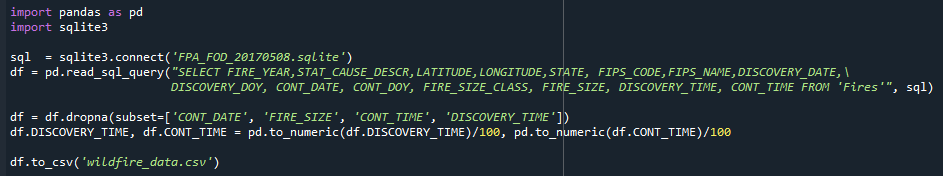

In [2]:
from IPython.display import Image
Image(filename='code_load_data.png')

In [2]:
df = pd.read_csv('wildfire_data.csv')
print('Number of fires:', df.shape[0])
df.head()

Number of fires: 892007


/opt/python/envs/default/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3457: DtypeWarning:

Columns (7) have mixed types.Specify dtype option on import or set low_memory=False.



,Unnamed: 0,FIRE_YEAR,STAT_CAUSE_DESCR,LATITUDE,LONGITUDE,STATE,FIPS_CODE,FIPS_NAME,DISCOVERY_DATE,DISCOVERY_DOY,CONT_DATE,CONT_DOY,FIRE_SIZE_CLASS,FIRE_SIZE,DISCOVERY_TIME,CONT_TIME
0,0,2005,Miscellaneous,40.036944,-121.005833,CA,63.0,Plumas,2453403.5,33,2453403.5,33.0,A,0.10,13.00,17.30
1,1,2004,Lightning,38.933056,-120.404444,CA,61.0,Placer,2453137.5,133,2453137.5,133.0,A,0.25,8.45,15.30
2,2,2004,Debris Burning,38.984167,-120.735556,CA,17.0,El Dorado,2453156.5,152,2453156.5,152.0,A,0.10,19.21,20.24
3,3,2004,Lightning,38.559167,-119.913333,CA,3.0,Alpine,2453184.5,180,2453189.5,185.0,A,0.10,16.00,14.00
4,4,2004,Lightning,38.559167,-119.933056,CA,3.0,Alpine,2453184.5,180,2453189.5,185.0,A,0.10,16.00,12.00


# **Climate features**

In [3]:
df = pd.read_csv('wildfire_data_with_climate.csv')
print('Number of fires:', df.shape[0])
df.head()

Number of fires: 892007


/opt/python/envs/default/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3457: DtypeWarning:

Columns (7) have mixed types.Specify dtype option on import or set low_memory=False.



,Unnamed: 0,FIRE_YEAR,STAT_CAUSE_DESCR,LATITUDE,LONGITUDE,STATE,FIPS_CODE,FIPS_NAME,DISCOVERY_DATE,DISCOVERY_DOY,...,DISCOVERY_TIME,CONT_TIME,tmp,pcp,pdsi,DATE,MONTH,tmp_monthly,pcp_monthly,pdsi_monthly
0,0,2005,Miscellaneous,40.036944,-121.005833,CA,63.0,Plumas,2453403.5,33,...,13.00,17.30,59.736364,2.026364,3.050000,2005-02-02,2,47.1,4.03,2.28
1,1,2004,Lightning,38.933056,-120.404444,CA,61.0,Placer,2453137.5,133,...,8.45,15.30,60.154545,1.477273,-1.234545,2004-05-12,5,63.2,0.45,-2.15
2,2,2004,Debris Burning,38.984167,-120.735556,CA,17.0,El Dorado,2453156.5,152,...,19.21,20.24,60.154545,1.477273,-1.234545,2004-05-31,5,63.2,0.45,-2.15
3,3,2004,Lightning,38.559167,-119.913333,CA,3.0,Alpine,2453184.5,180,...,16.00,14.00,60.154545,1.477273,-1.234545,2004-06-28,6,70.4,0.08,-2.80
4,4,2004,Lightning,38.559167,-119.933056,CA,3.0,Alpine,2453184.5,180,...,16.00,12.00,60.154545,1.477273,-1.234545,2004-06-28,6,70.4,0.08,-2.80


The feature matching is performed in my local server because of unstable connection here. See 'ClimateMatch.py' for the code.

**Six new features are added:**
- 'tmp_monthly': the average temprature of the month in the state when and where the fire happened.
- 'pcp_monthly': the average precipitition of the month in the state when and where the fire happened.
- 'pdsi_monthly': the Palmer Drought Severity Index of the month in the state when and where the fire happened.
- 'tmp_yearly': the average temprature of the year in the state when and where the fire happened.
- 'pcp_yearly': the average precipitition of the year in the state when and where the fire happened.
- 'pdsi_yearly': the average Palmer Drought Severity Index of the year in the state when and where the fire happened.

*Note that the missing values are marked as -99.99.*

**Data source:** 

Vose, R. S., Applequist, S., Squires, M., Durre, I., Menne, M. J., Williams, C. N., Jr., Fenimore, C., Gleason, K., & Arndt, D. (2014). Improved Historical Temperature and Precipitation Time Series for U.S. Climate Divisions, Journal of Applied Meteorology and Climatology, 53(5), 1232-1251. Retrieved Feb 6, 2023, from https://journals.ametsoc.org/view/journals/apme/53/5/jamc-d-13-0248.1.xml

Readme file of the dataset: https://www.ncei.noaa.gov/pub/data/cirs/climdiv/state-readme.txt


Data file used in the the following analysis: 'climdiv-pcpnst-v1.0.0-20230106.txt', 'climdiv-pdsist-v1.0.0-20230106.txt', and 'climdiv-tmpcst-v1.0.0-20230106.txt'

# Neighborhood Containment Time
'CreateFeature.py' contains the code for both extracting climate features and creating the neighborhood containment time features.

Two columns added are:

*NEARBY_HOUR_TO_CONT*: the average containment time (in hours) of fires in the nearby areas in the past one year.

*NEARBY_DAY_TO_CONT*: the average containment time (in days) of fires in the nearby areas in the past one year.

'Nearby areas' is defined by within 0.5 degrees from the targeted fire site in latitude and longitude.

In [3]:
df = pd.read_csv('wildfire_data_climate_nearby.csv')
print('Number of fires:', df.shape[0])
df.head()

Number of fires: 892007


/opt/python/envs/default/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3457: DtypeWarning:

Columns (7) have mixed types.Specify dtype option on import or set low_memory=False.



,Unnamed: 0,FIRE_YEAR,STAT_CAUSE_DESCR,LATITUDE,LONGITUDE,STATE,FIPS_CODE,FIPS_NAME,DISCOVERY_DATE,DISCOVERY_DOY,...,pdsi,DATE,MONTH,tmp_monthly,pcp_monthly,pdsi_monthly,DAY_TO_CONT,HOUR_TO_CONT,NEARBY_HOUR_TO_CONT,NEARBY_DAY_TO_CONT
0,0,2005,Miscellaneous,40.036944,-121.005833,CA,63.0,Plumas,2453403.5,33,...,3.050000,2005-02-02,2,47.1,4.03,2.28,0,4,110.900000,5.0
1,1,2004,Lightning,38.933056,-120.404444,CA,61.0,Placer,2453137.5,133,...,-1.234545,2004-05-12,5,63.2,0.45,-2.15,0,7,29.902778,1.0
2,2,2004,Debris Burning,38.984167,-120.735556,CA,17.0,El Dorado,2453156.5,152,...,-1.234545,2004-05-31,5,63.2,0.45,-2.15,0,1,23.119355,1.0
3,3,2004,Lightning,38.559167,-119.913333,CA,3.0,Alpine,2453184.5,180,...,-1.234545,2004-06-28,6,70.4,0.08,-2.80,5,118,16.709821,1.0
4,4,2004,Lightning,38.559167,-119.933056,CA,3.0,Alpine,2453184.5,180,...,-1.234545,2004-06-28,6,70.4,0.08,-2.80,5,116,16.570796,1.0


# **Preliminary Analysis**
- Data Inspection
- Data Summary Stats
- Data Visualization

In [14]:
# Class counts
df['FIRE_SIZE_CLASS'].value_counts() 

B 386748
A 380835
C 92523
D 14622
E 8544
F 5584
G 3151
Name: FIRE_SIZE_CLASS, dtype: int64

In [4]:
# we can use the discovery time to investigate whether the fire army has improved (e.g. did the discovery time decreases?)

lDAY_TO_CONT=[]
lHOUR_TO_CONT = []
for i in df.index:
    vDay2cont = df.loc[i,'CONT_DATE']-df.loc[i,'DISCOVERY_DATE']
    vHour2cont = (24 - df.loc[i,'DISCOVERY_TIME']) + (vDay2cont-1)*24 + df.loc[i,'CONT_TIME']
    lDAY_TO_CONT.append(round(vDay2cont))
    lHOUR_TO_CONT.append(round(vHour2cont)) # this also rounds it to full hours, may be relaxed
df['DAY_TO_CONT'] = lDAY_TO_CONT
df['HOUR_TO_CONT'] = lHOUR_TO_CONT
# df = df[df['DAY_TO_CONT']>0]

# get frequency of wildfires for each year
years = df['FIRE_YEAR'].unique()
years.sort()
freqs = []
for year in years:
    freq = float(df['FIRE_YEAR'][df['FIRE_YEAR'] == year].count() / 365)
    freqs.append(freq)
    # print(f'Frequency: {year} -> ', freq)
    
freqs_dict = {'year': years, 'frequency': freqs}
df_freq = pd.DataFrame(data=freqs_dict)

# get dates of discovery in normal date format
df['DATE'] = pd.to_datetime(df['DISCOVERY_DATE'], unit='D', origin='julian')

In [16]:

# plot of discoveries over time, per size of fire
def disc_over_time():
    dfA = df[df.FIRE_SIZE_CLASS == 'A']
    dfB = df[df.FIRE_SIZE_CLASS == 'B']
    dfC = df[df.FIRE_SIZE_CLASS == 'C']
    dfD = df[df.FIRE_SIZE_CLASS == 'D']
    dfE = df[df.FIRE_SIZE_CLASS == 'E']
    dfF = df[df.FIRE_SIZE_CLASS == 'F']
    dfG = df[df.FIRE_SIZE_CLASS == 'G']
    
    # trace0 = go.Scatter(
    #     x=df['DATE'].unique(),
    #     y=df.groupby("DATE").size(),
    #     opacity=0.75,
    #     name = "All",
    #     marker=dict(color='rgba(171, 50, 96, 0.6)'))
    
    plt.plot(df.groupby("DATE").size(), label ='All')
    # plt.xticks(np.arange(0,len(df['DATE'].unique()),1)[::20],df['DATE'].unique()[::20])
    plt.title('All wildfires over time')
    plt.savefig('daily_wildfires.png')
    plt.show()
    
    plt.plot(dfA.groupby('DATE').size(), label='A')
    plt.plot(dfB.groupby('DATE').size(), label='B')
    plt.plot(dfC.groupby('DATE').size(), label='C')
    plt.plot(dfD.groupby('DATE').size(), label='D')
    plt.plot(dfE.groupby('DATE').size(), label='E')
    plt.plot(dfF.groupby('DATE').size(), label='F')
    plt.title('Fires over time per class')
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.legend()
    plt.show()
    
    plt.plot(df.groupby("DATE").size().cumsum())
    plt.title('Cumulative No. of Wildfires over Time')
    plt.show()
    
    # trace1 = go.Scatter(
    #     x=dfA['DATE'].unique(),
    #     y=dfA.groupby("DATE").size(),
    #     opacity=0.75,
    #     name = "A",
    #     marker=dict(color='rgba(171, 50, 96, 0.6)'))
    # trace2 = go.Scatter(
        
    #     y=dfB.groupby("DATE").size(),
    #     opacity=0.75,
    #     name = "B",
    #     marker=dict(color='rgba(12, 50, 196, 0.6)'))
    # trace3 = go.Scatter(
        
    #     y=dfC.groupby("DATE").size(),
    #     opacity=0.75,
    #     name = "C",
    #     marker=dict(color='rgb(12, 128, 128)'))
    # trace4 = go.Scatter(
        
    #     y=dfD.groupby("DATE").size(),
    #     opacity=0.75,
    #     name = "D",
    #     marker=dict(color='rgb(127, 127, 127)'))
    # trace5 = go.Scatter(
        
    #     y=dfE.groupby("DATE").size(),
    #     opacity=0.75,
    #     name = "E",
    #     marker=dict(color='rgb(140, 86, 75)'))
    # trace6 = go.Scatter(
        
    #     y=dfF.groupby("DATE").size(),
    #     opacity=0.75,
    #     name = "F",
    #     marker=dict(color='rgb(255, 127, 14)'))
    # trace7 = go.Scatter(
        
    #     y=dfG.groupby("DATE").size(),
    #     opacity=0.75,
    #     name = "G",
    #     marker=dict(color='rgb(214, 39, 40) '))
    
    # data = [trace0,trace1,trace2, trace3, trace4, trace5, trace6, trace7]
    # layout = go.Layout(
    #                     title=' Daily count of Fire Class A B C D E F G',
    #                     xaxis=dict(title='Date'),
    #                     yaxis=dict( title='Count'),
    # )
    # fig = go.Figure(data=data, layout=layout)
    # # iplot(fig)
   
    
# Histogram of wildfire per day in year, for each size of fire
def create_hist_disc():
    dfA = df.DISCOVERY_DOY[df.FIRE_SIZE_CLASS == 'A']
    dfB = df.DISCOVERY_DOY[df.FIRE_SIZE_CLASS == 'B']
    dfC = df.DISCOVERY_DOY[df.FIRE_SIZE_CLASS == 'C']
    dfD = df.DISCOVERY_DOY[df.FIRE_SIZE_CLASS == 'D']
    dfE = df.DISCOVERY_DOY[df.FIRE_SIZE_CLASS == 'E']
    dfF = df.DISCOVERY_DOY[df.FIRE_SIZE_CLASS == 'F']
    dfG = df.DISCOVERY_DOY[df.FIRE_SIZE_CLASS == 'G']
    #dfD = df['JUL_DAY'].loc[~df['FIRE_SIZE_CLASS'].isin(large_fires)]
    
    trace1 = go.Histogram(
        x=dfA,
        opacity=0.75,
        name = "A",
        marker=dict(color='rgba(171, 50, 96, 0.6)'))
    trace2 = go.Histogram(
        x=dfB,
        opacity=0.75,
        name = "B",
        marker=dict(color='rgba(12, 50, 196, 0.6)'))
    trace3 = go.Histogram(
        x=dfC,
        opacity=0.75,
        name = "C",
        marker=dict(color='rgb(12, 128, 128)'))
    trace4 = go.Histogram(
        x=dfD,
        opacity=0.75,
        name = "D",
        marker=dict(color='rgb(127, 127, 127)'))
    trace5 = go.Histogram(
        x=dfE,
        opacity=0.75,
        name = "E",
        marker=dict(color='rgb(140, 86, 75)'))
    trace6 = go.Histogram(
        x=dfF,
        opacity=0.75,
        name = "F",
        marker=dict(color='rgb(255, 127, 14)'))
    trace7 = go.Histogram(
        x=dfG,
        opacity=0.75,
        name = "G",
        marker=dict(color='rgb(214, 39, 40) '))
    
    data = [trace1,trace2, trace3, trace4, trace5, trace6, trace7]
    layout = go.Layout(barmode='overlay',
                       title=' yearly count of Fire Class A B C D E F G',
                       xaxis=dict(title='day of the year'),
                       yaxis=dict( title='Count'),
    )
    fig = go.Figure(data=data, layout=layout)
    iplot(fig)

# Visual map of all wildfires per size
def create_full_map():
    dfA = df[df.FIRE_SIZE_CLASS == 'A']
    dfB = df[df.FIRE_SIZE_CLASS == 'B']
    dfC = df[df.FIRE_SIZE_CLASS == 'C']
    dfD = df[df.FIRE_SIZE_CLASS == 'D']
    dfE = df[df.FIRE_SIZE_CLASS == 'E']
    dfF = df[df.FIRE_SIZE_CLASS == 'F']
    dfG = df[df.FIRE_SIZE_CLASS == 'G']
    
    # creating trace1
    trace1 = go.Scatter(
                        x = dfA.LONGITUDE,
                        y = dfA.LATITUDE,
                        mode = "markers",
                        name = "A",
                        opacity=0.5,
                        marker=dict(color='rgba(171, 50, 96, 0.6)'),
                        text= dfA.FIRE_SIZE_CLASS)
    trace2 = go.Scatter(
                        x=dfB.LONGITUDE,
                        y = dfB.LATITUDE,
                        mode = "markers",
                        opacity=0.5,
                        name = "B",
                        text= dfB.FIRE_SIZE_CLASS,
                        marker=dict(color='rgba(12, 50, 196, 0.6)'))
    trace3 = go.Scatter(
                        x=dfC.LONGITUDE,
                        y = dfC.LATITUDE,
                        name = "C",
                        mode = "markers",
                        opacity=0.5,
                        text= dfC.FIRE_SIZE_CLASS,
                        marker=dict(color='rgb(12, 128, 128)'))
    trace4 = go.Scatter(
        x=dfD.LONGITUDE,
        y = dfD.LATITUDE,
        opacity=0.5,
        name = "D",
        mode = "markers",
        text= dfD.FIRE_SIZE_CLASS,
        marker=dict(color='rgb(127, 127, 127)'))
    trace5 = go.Scatter(
        x=dfE.LONGITUDE,
        y = dfE.LATITUDE,
        opacity=0.5,
        name = "E",
        mode = "markers",
        text= dfE.FIRE_SIZE_CLASS,
        marker=dict(color='rgb(140, 86, 75)'))
    trace6 = go.Scatter(
        x=dfF.LONGITUDE,
        y = dfF.LATITUDE,
        opacity=0.5,
        name = "F",
        mode = "markers",
        text= dfF.FIRE_SIZE_CLASS,
        marker=dict(color='rgb(255, 127, 14)'))
    trace7 = go.Scatter(
        x=dfG.LONGITUDE,
        y = dfG.LATITUDE,
        name = "G",
        mode = "markers",
        opacity=0.5,
        text= dfG.FIRE_SIZE_CLASS,
        marker=dict(color='rgb(214, 39, 40) '))
    
    
    data = [trace1,trace2, trace3, trace4, trace5, trace6, trace7]
    
    layout = dict(title = 'Location of fires of different class size',
                  xaxis= dict(title= 'LONGITUDE',ticklen= 5,zeroline= False),
                  yaxis= dict(title= 'LATITUDE',ticklen= 5,zeroline= False)
                 )
    fig = dict(data = data, layout = layout)
    iplot(fig)

## **Data Summary**

In [17]:
print('Quick Summary')
print(df.describe())

Quick Summary
         Unnamed: 0      FIRE_YEAR       LATITUDE      LONGITUDE  \
count  8.920070e+05  892007.000000  892007.000000  892007.000000   
mean   9.139487e+05    2004.269999      38.400655     -99.030678   
std    6.545665e+05       7.237650       5.721539      16.228204   
min    0.000000e+00    1992.000000      17.939722    -168.870000   
25%    2.235105e+05    1998.000000      33.835001    -113.584100   
50%    1.174276e+06    2005.000000      37.472360     -96.948900   
75%    1.494792e+06    2011.000000      43.006300     -83.827100   
max    1.880460e+06    2015.000000      70.330600     -65.256944   

           FIPS_CODE  DISCOVERY_DATE  DISCOVERY_DOY     CONT_DATE  \
count  581159.000000    8.920070e+05  892007.000000  8.920070e+05   
mean       81.003718    2.453276e+06     172.261729  2.453277e+06   
std        73.619162    2.642604e+03      83.357141  2.643105e+03   
min         1.000000    2.448622e+06       1.000000  2.448622e+06   
25%        29.000000    2.45

Percentage of wildfires with lower than 10 hours:
81.11


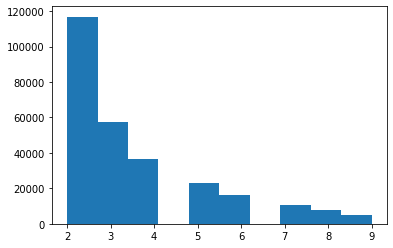

In [9]:
# histogram time until containment
iCensor = 10
sHours_censored = df.HOUR_TO_CONT[df.HOUR_TO_CONT < iCensor]
print('Percentage of wildfires with lower than %d hours:'%iCensor)
print(round(len(sHours_censored)/len(df.HOUR_TO_CONT)*100,2))
plt.hist(sHours_censored[sHours_censored > 1])
plt.show()

count    162764.000000
mean          2.839025
std           4.153684
min           1.000000
25%           1.000000
50%           1.000000
75%           3.000000
max          29.000000
Name: DAY_TO_CONT, dtype: float64


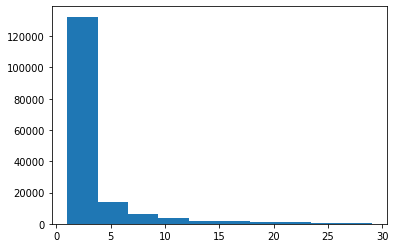

In [35]:
sContDays = df.DAY_TO_CONT[(df.DAY_TO_CONT>0)&(df.DAY_TO_CONT<30)]
print(sContDays.describe())
plt.hist(sContDays)
plt.show()

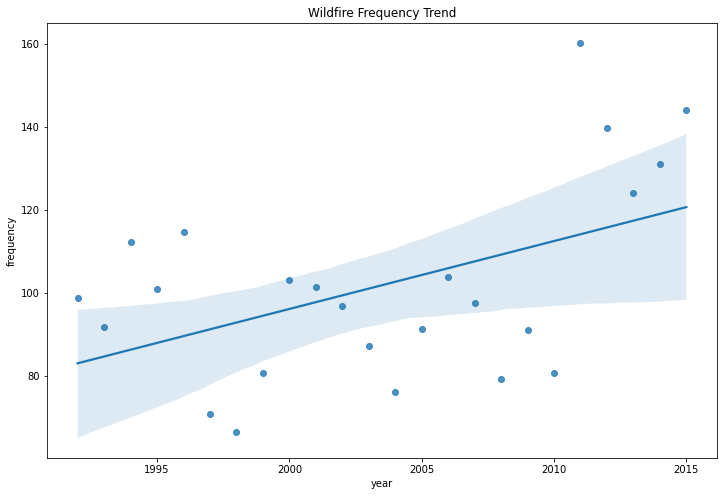

In [9]:
# frequency (per year)
fig, ax = plt.subplots(figsize=(12,8))
sns.regplot(x=df_freq['year'], y=df_freq['frequency'])
plt.title('Wildfire Frequency Trend')
plt.savefig('frequency_trend.png', bbox_inches='tight')
plt.show()

In [37]:
# cause frequency
print('Cause Frequency')
print(df['STAT_CAUSE_DESCR'].value_counts()/len(df)*100)

Cause Frequency
Lightning            24.617856
Debris Burning       19.282584
Miscellaneous        16.539220
Arson                15.566358
Campfire              5.810717
Equipment Use         5.499508
Missing/Undefined     3.905351
Children              3.063429
Smoking               2.519599
Fireworks             1.150776
Railroad              0.885980
Powerline             0.867818
Structure             0.290805
Name: STAT_CAUSE_DESCR, dtype: float64


In [ ]:
# map of fires (over all years)
#create_full_map()

In [13]:
# discovery day distribution
create_hist_disc()

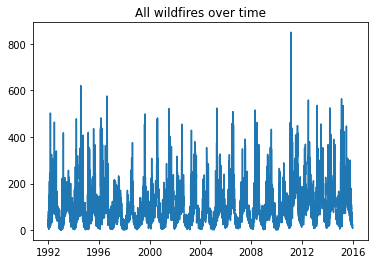

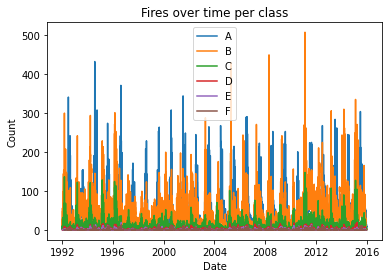

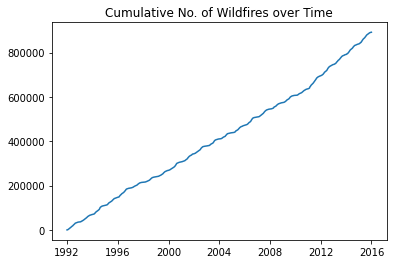

In [44]:
# discoveries over time
disc_over_time()

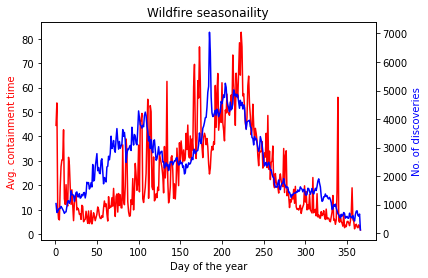

In [60]:
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()
ax1.plot(df.groupby('DISCOVERY_DOY')['HOUR_TO_CONT'].mean(),'r-')
ax2.plot(df.groupby('DISCOVERY_DOY').size(), 'b-')
ax1.set_xlabel('Day of the year')
ax1.set_ylabel('Avg. containment time', color='r')
ax2.set_ylabel('No. of discoveries', color='b')
plt.title('Wildfire seasonaility')
plt.savefig('data_seasonaility.png')
plt.show()

# plt.plot(df.groupby('DATE')['HOUR_TO_CONT'].mean())
# plt.show()

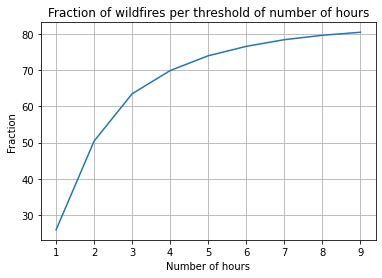

In [6]:
vHours = np.arange(1,10,1)
vPerc = np.zeros(len(vHours))
for i in range(len(vHours)):
    vPerc[i] = len(df.HOUR_TO_CONT[df.HOUR_TO_CONT < vHours[i]])/len(df.HOUR_TO_CONT)*100

plt.plot(vHours,vPerc)
plt.grid()
plt.title('Fraction of wildfires per threshold of number of hours')
plt.xlabel('Number of hours')
plt.ylabel('Fraction')
plt.savefig('data_fraction.png')
plt.show()

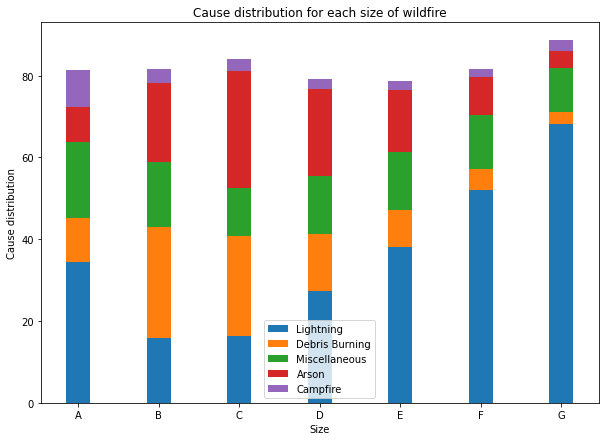

In [19]:
lightning = 100*df[df.STAT_CAUSE_DESCR=='Lightning'].groupby('FIRE_SIZE_CLASS').size()/(df.groupby('FIRE_SIZE_CLASS').size())
debris = 100*df[df.STAT_CAUSE_DESCR=='Debris Burning'].groupby('FIRE_SIZE_CLASS').size()/(df.groupby('FIRE_SIZE_CLASS').size())
miscel = 100*df[df.STAT_CAUSE_DESCR=='Miscellaneous'].groupby('FIRE_SIZE_CLASS').size()/(df.groupby('FIRE_SIZE_CLASS').size())
arson = 100*df[df.STAT_CAUSE_DESCR=='Arson'].groupby('FIRE_SIZE_CLASS').size()/(df.groupby('FIRE_SIZE_CLASS').size())
campfire = 100*df[df.STAT_CAUSE_DESCR=='Campfire'].groupby('FIRE_SIZE_CLASS').size()/(df.groupby('FIRE_SIZE_CLASS').size())

ind = np.arange(7)
width = 0.3
fig = plt.subplots(figsize=(10,7))
p1 = plt.bar(ind, lightning, width)
p2 = plt.bar(ind, debris, width, bottom=lightning)
p3 = plt.bar(ind, miscel, width, bottom=lightning+debris)
p4 = plt.bar(ind, arson, width, bottom=lightning+debris + miscel)
p5 = plt.bar(ind, campfire, width, bottom=lightning+debris+miscel+arson)
plt.xticks(ind,('A', 'B', 'C', 'D', 'E', 'F', 'G'))
plt.legend((p1[0], p2[0], p3[0], p4[0], p5[0]),('Lightning', 'Debris Burning', 'Miscellaneous', 'Arson', 'Campfire'))
plt.xlabel('Size')
plt.ylabel('Cause distribution')
plt.title('Cause distribution for each size of wildfire')
plt.savefig('cause_distribution.png')
plt.show()

# California analysis

In [7]:
df_CA = df.loc[df['STATE'] == 'CA']
df_CA = df_CA.groupby('DISCOVERY_DATE').mean(['FIRE_SIZE', 'HOUR_TO_CONT'])[['FIRE_SIZE', 'HOUR_TO_CONT']]
df_CA = df_CA[np.abs(df_CA.HOUR_TO_CONT) < 140] # remove outliers

vY = df_CA.HOUR_TO_CONT.to_numpy()
vGrowth = vY[1:] - vY[:-1] # take first-differences to get stationary sequence. It is the growth in number of wildfires. Regression
vGrowth = vGrowth[:-1]
vY_class = (vY > 10)*1 + (vY> 20)*1 # for classification of daily average of hours until containment
vY_CA = vY_class[2:]
mX_CA = np.vstack((np.ones(len(vGrowth)), vGrowth, df_CA.FIRE_SIZE.to_numpy()[:-2])).T

## Time series prediction
Suppose we are the California governmental body that decides to allocate budget to wildfire prevention. We want to forecast the wildfire growth as good as possible, on average over the state. Suppose the instituion has a budget to prevent wildfires. We try to minimize the number of classfications to waiste budget.

In [8]:
dBudget = 1000 # without loss of generality


mX_CA = mX_CA[:10000,:]
vY_CA = vY_CA[:10000]
# Create train-test set
X_train, X_test, Y_train, Y_test = train_test_split(mX_CA, vY_CA, test_size=0.25, random_state=1)
X_train = X_train.reshape(-1,3)
X_test = X_test.reshape(-1,3)
Y_train = Y_train.reshape(-1,1)
Y_test = Y_test.reshape(-1,1)


import tensorflow as tf
from tensorflow import keras
model = keras.models.Sequential([
    keras.layers.Dense(300, activation="relu"),
    keras.layers.Dense(100, activation="relu"),
    keras.layers.Dense(10, activation="softmax")
])
model.compile(loss="sparse_categorical_crossentropy",
              optimizer="sgd",
              metrics=["accuracy"])
history = model.fit(X_train, Y_train, epochs=30)

predictions = model.predict(X_test)
classes = np.argmax(predictions, axis=1)

Epoch 1/30
178/178 [==============================] - 1s 2ms/step - loss: 2.6551 - accuracy: 0.7507
Epoch 2/30
178/178 [==============================] - 0s 2ms/step - loss: 1.1491 - accuracy: 0.7810
Epoch 3/30
178/178 [==============================] - 0s 2ms/step - loss: 0.7989 - accuracy: 0.7889
Epoch 4/30
178/178 [==============================] - 0s 2ms/step - loss: 0.7321 - accuracy: 0.7886
Epoch 5/30
178/178 [==============================] - 0s 2ms/step - loss: 0.7537 - accuracy: 0.7877
Epoch 6/30
178/178 [==============================] - 0s 2ms/step - loss: 0.6980 - accuracy: 0.7930
Epoch 7/30
178/178 [==============================] - 0s 2ms/step - loss: 0.6960 - accuracy: 0.7926
Epoch 8/30
178/178 [==============================] - 0s 2ms/step - loss: 0.7560 - accuracy: 0.7925
Epoch 9/30
178/178 [==============================] - 0s 2ms/step - loss: 0.6683 - accuracy: 0.7928
Epoch 10/30
178/178 [==============================] - 0s 2ms/step - loss: 0.6593 - accuracy: 0.7946

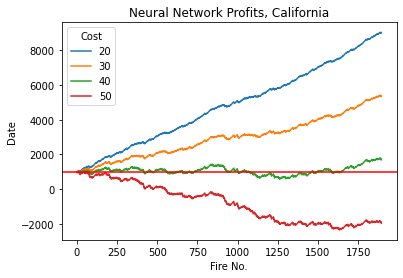

In [13]:
vCosts = [20, 30, 40, 50]
mBudget = np.ones((len(classes)+1,4))*dBudget
for j in range(4):  
    dCost = vCosts[j]
    for i in range(len(classes)):
        mBudget[i+1,j] = mBudget[i,j] + (classes[i]==Y_test[i])*10 + (classes[i]!=Y_test[i])*(-dCost)
    plt.plot(mBudget[:,j], label=dCost)
plt.axhline(y=1000, c='r')
plt.legend(title='Cost')
plt.ylabel('Date')
plt.xlabel('Fire No.')
plt.title('Neural Network Profits, California')
plt.savefig('calibudget.png')
plt.show()

Conclusion from above:
if we earn 10 by correctly estimating the wildfire severity that day and waiste 40 if we are wrong (e.g. waiste of personnel, waiste of machinery, etc.), then the plot shows that our model is able to remain profitable over time.